# Análise Descritiva 3 - Gráficos interativos

- Trabalhando com dados temporais 

> "O tempo é o mais sábio de todos os conselheiros."  
Pericles, estadista grego.   

<span style='color:purple'>
    
**Os nossos objetivos são:**

- Ser capaz de baixar dados do Yahoo Finance
- Ampliar o contato com dados de séries de tempo
- Aprender o básico sobre o Plotly


**Antes de começar:**  
Vamos precisar do `yahoo finance` e do ```Plotly```.

>```pip install plotly```
>
>```pip install yfinance```

[Instalação do Plotly](https://dash.plotly.com/installation)  


## 1 - Baixando dados da bolsa

- Carregar dados de índices ou ativos financeiros usando Python
- Compreender como referenciar dados em um objeto com índices múltiplos
- Dominar a seleção de valores ajustados de fechamento para uso em gráficos

**Instalação de pacotes**

In [30]:
# !pip install plotly
# !pip install pandas-datareader
# !pip install yfinance

### Carregando dados de ativos e índices

A melhor forma gratuita de se obter dados de ativos financeiros é através do Yahoo Finance.

In [33]:
# Carregando bibliotecas 
import yfinance as yf

import plotly.express as px
from plotly import graph_objects

import pandas as pd
import numpy as np

Cada uma dessas coisas estão armazenados em um conjunto de dados. Índices no Yahoo Finance (`yfinance`) estão em conjuntos de dados cujo nome começa com um circunflexo (```^```) como o IBOVESPA (```^BVSP```) e ações **brasileiras** o nome termina com ```.SA``` como ```PETR4.SA```.

Parâmetros:

- **name** - um string com o nome do conjunto de dados - um ativo ou índice no nosso caso
- **data_source** - o nome da fonte dos dados
- **start** - a data inicial da solicitação
- **end** - a data final da solicitação (se vazio, faz um *slicing* até a data mais recente)

In [35]:
%%time

# Obtendo dados a partir do yahoo finance
data = yf.download('^BVSP', start = '2024-01-01', end = '2024-12-31')
data = data.xs('^BVSP', level='Ticker', axis=1)
data['return'] = data['Close'].pct_change()

print(data.shape)
data.tail()

[*********************100%***********************]  1 of 1 completed

(251, 6)
CPU times: total: 62.5 ms
Wall time: 541 ms


Price,Close,High,Low,Open,Volume,return
Date,,,,,,
2024-12-20,122102.0,122209.0,120700.0,121183.0,18128200,0.007542
2024-12-23,120767.0,122105.0,120617.0,122105.0,9953300,-0.010933
2024-12-26,121078.0,121612.0,120428.0,120767.0,8338500,0.002575
2024-12-27,120269.0,121609.0,120252.0,121078.0,8937000,-0.006682
2024-12-30,120283.0,121050.0,120158.0,120267.0,8895300,0.000116


In [36]:
%%time

# Importando multiplos tickers

ativos = ['^BVSP','ITSA3.SA', 'PETR4.SA', 'ABEV3.SA', 'VALE3.SA']
start = '2016-01-01'

data = yf.download(ativos, start = start)
print(data.shape)
data.tail()

[*********************100%***********************]  5 of 5 completed

(2299, 25)
CPU times: total: 266 ms
Wall time: 644 ms


Price         Close                                              High  \
Ticker     ABEV3.SA ITSA3.SA   PETR4.SA   VALE3.SA     ^BVSP ABEV3.SA   
Date                                                                    
2025-03-20    13.60     9.93  36.240002  57.240002  131955.0    13.69   
2025-03-21    13.73     9.97  36.799999  57.450001  132345.0    13.75   
2025-03-24    13.54     9.95  36.750000  57.150002  131321.0    13.79   
2025-03-25    13.60     9.91  37.040001  57.340000  132068.0    13.66   
2025-03-26    13.38     9.89  37.389999  57.689999  132520.0    13.53   

Price                                                ...     Open           \
Ticker     ITSA3.SA   PETR4.SA   VALE3.SA     ^BVSP  ... ABEV3.SA ITSA3.SA   
Date                                                 ...                     
2025-03-20    10.08  36.480000  57.490002  132713.0  ...    13.68    10.02   
2025-03-21    10.00  37.029999  57.450001  132588.0  ...    13.63     9.93   
2025-03-24    10.05  36.939999  58.240002  132424.0  ...    13.76     9.99   
2025-03-25    10.12  37.520000  57.750000  133471.0  ...    13.49     9.96   
2025-03-26    10.01  37.630001  58.040001  132984.0  ...    13.53     9.95   

Price                                         Volume                     \
Ticker       PETR4.SA   VALE3.SA     ^BVSP  ABEV3.SA ITSA3.SA  PETR4.SA   
Date                                                                      
2025-03-20  36.160000  57.040001  132505.0  18669000   117500  46921900   
2025-03-21  36.220001  56.950001  132005.0  28909800    77500  61175700   
2025-03-24  36.700001  57.950001  132344.0  21122400   111800  20348000   
2025-03-25  36.849998  57.320000  131327.0  20685600   153600  28036100   
2025-03-26  37.150002  57.400002  132069.0  29019200    78400  26870300   

Price                             
Ticker      VALE3.SA       ^BVSP  
Date                              
2025-03-20  17283200  14187500.0  
2025-03-21  30524100  14192000.0  
2025-03-24  18646500   8301200.0  
2025-03-25  15615800   9237600.0  
2025-03-26  29401600   9404600.0  

[5 rows x 25 columns]

In [37]:
data.columns
# As colunas são índices múltiplos

MultiIndex([( 'Close', 'ABEV3.SA'),
            ( 'Close', 'ITSA3.SA'),
            ( 'Close', 'PETR4.SA'),
            ( 'Close', 'VALE3.SA'),
            ( 'Close',    '^BVSP'),
            (  'High', 'ABEV3.SA'),
            (  'High', 'ITSA3.SA'),
            (  'High', 'PETR4.SA'),
            (  'High', 'VALE3.SA'),
            (  'High',    '^BVSP'),
            (   'Low', 'ABEV3.SA'),
            (   'Low', 'ITSA3.SA'),
            (   'Low', 'PETR4.SA'),
            (   'Low', 'VALE3.SA'),
            (   'Low',    '^BVSP'),
            (  'Open', 'ABEV3.SA'),
            (  'Open', 'ITSA3.SA'),
            (  'Open', 'PETR4.SA'),
            (  'Open', 'VALE3.SA'),
            (  'Open',    '^BVSP'),
            ('Volume', 'ABEV3.SA'),
            ('Volume', 'ITSA3.SA'),
            ('Volume', 'PETR4.SA'),
            ('Volume', 'VALE3.SA'),
            ('Volume',    '^BVSP')],
           names=['Price', 'Ticker'])

In [38]:
# Acessando valores através das tuplas
data[( 'Close', 'ABEV3.SA')], data[(  'Open', 'VALE3.SA')]

(Date
 2016-01-04    12.474180
 2016-01-05    12.669882
 2016-01-06    12.546660
 2016-01-07    12.213244
 2016-01-08    12.372704
                 ...    
 2025-03-20    13.600000
 2025-03-21    13.730000
 2025-03-24    13.540000
 2025-03-25    13.600000
 2025-03-26    13.380000
 Name: (Close, ABEV3.SA), Length: 2299, dtype: float64,
 Date
 2016-01-04     6.865917
 2016-01-05     6.964866
 2016-01-06     6.640534
 2016-01-07     6.189771
 2016-01-08     6.085325
                 ...    
 2025-03-20    57.040001
 2025-03-21    56.950001
 2025-03-24    57.950001
 2025-03-25    57.320000
 2025-03-26    57.400002
 Name: (Open, VALE3.SA), Length: 2299, dtype: float64)

**Temos múltiplos índices (múltiplas tabelas) e podemos acessá-los indicando as colunas(tabelas), como "close", "volume", etc.**

- Índices hierárquicos
- Teremos como retorno um dataframe

In [40]:
# Para o fechamento
data['Close'].head()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2016-01-04,12.474180,2.390931,2.038372,6.975860,42141.0
2016-01-05,12.669882,2.401478,1.981998,6.882409,42419.0
2016-01-06,12.546660,2.429608,1.898920,6.376672,41773.0
2016-01-07,12.213244,2.390931,1.857381,5.997371,40695.0
2016-01-08,12.372704,2.415543,1.860348,5.793977,40612.0


In [41]:
# Para a alta
data['High'].head()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2016-01-04,12.851088,2.513993,2.085845,7.135276,43349.0
2016-01-05,12.698875,2.457736,2.076944,7.058317,42534.0
2016-01-06,12.669880,2.454220,1.940459,6.657026,42410.0
2016-01-07,12.553910,2.404995,1.907821,6.250239,41772.0
2016-01-08,12.466931,2.415543,1.913755,6.184273,41218.0


Podemos utilizar o `stack()` para empilhar os dados e montar nosso gráfico. Observe como os valores ficam em uma única coluna, com o nome do ativo e a data indicados em duas  outas colunas

In [43]:
data['Close'].stack()

Date        Ticker  
2016-01-04  ABEV3.SA        12.474180
            ITSA3.SA         2.390931
            PETR4.SA         2.038372
            VALE3.SA         6.975860
            ^BVSP        42141.000000
                            ...      
2025-03-26  ABEV3.SA        13.380000
            ITSA3.SA         9.890000
            PETR4.SA        37.389999
            VALE3.SA        57.689999
            ^BVSP       132520.000000
Length: 11487, dtype: float64

In [44]:
fechamento = data['Close'].stack().reset_index()
fechamento.columns = ['data', 'ativo', 'valor']

print(fechamento.shape)
fechamento.head()

(11487, 3)


,data,ativo,valor
0,2016-01-04,ABEV3.SA,12.474180
1,2016-01-04,ITSA3.SA,2.390931
2,2016-01-04,PETR4.SA,2.038372
3,2016-01-04,VALE3.SA,6.975860
4,2016-01-04,^BVSP,42141.000000


## 2 - Plotly

- Criação de gráficos interativos (com o Plotly)
- Aplicar o comando *Express line* para criar gráficos de linhas com dados financeiros
- Exploração diferentes templates para alterar a aparência dos gráficos gerados

O Plotly é um dos pacotes gráficos mais populares entre usuários de Python e de outras plataformas, pois também tem interfaces para R, Julia e outras linguagens.

É um pacote gráfico *open source* baseado em browsers, que fornece gráficos que podem ser visualizados nos Jupyter Notebooks, além de integrar bem com o *streamlit* e aplicações web em geral.

Produz gráficos elegantes e traz elementos interessantes de interatividade com o cursor do mouse.

Para templates do plotly [clique aqui](https://plotly.com/python/templates/)  
Para visualizar uma galeria do plotly [clique aqui](https://plotly.com/python/)

In [47]:
fechamento.head(10)

,data,ativo,valor
0,2016-01-04,ABEV3.SA,12.474180
1,2016-01-04,ITSA3.SA,2.390931
2,2016-01-04,PETR4.SA,2.038372
3,2016-01-04,VALE3.SA,6.975860
4,2016-01-04,^BVSP,42141.000000
5,2016-01-05,ABEV3.SA,12.669882
6,2016-01-05,ITSA3.SA,2.401478
7,2016-01-05,PETR4.SA,1.981998
8,2016-01-05,VALE3.SA,6.882409
9,2016-01-05,^BVSP,42419.000000


In [48]:
# Gerando gráficos com o plotly_express

# fig = px.line(fechamento, x='data', y='valor', color='ativo', template='simple_white')
fig = px.line(fechamento, x='data', y='valor', color='ativo', template='plotly_white')
fig.show()

## 3 - Retorno de séries (Retorno de ações)

- Compreender o conceito de retorno de ações e correlações espúrias (correlação que não vem de um fenômeno legítimo)
- Remoção de tendência em séries com o intuito de evitar correlações espúrias
- Calcular o retorno de uma ação usando Python
- Dominar técnicas para remover a tendência de séries


[Correlação espúria](https://www.tylervigen.com/spurious-correlations)

O retorno é o ganho (ou perda) percentual que uma pessoa obtém se comprar uma ação em um momento $t_0$ e vender a mesma ação por um outro valor em um momento $t_1$. Dá pra entender por que é tão popular.

Por exemplo:

> Se você compra uma ação por 100 reais, e vende ela por 110, ela te dá de retorno 10%, que é:  
> $(110-100)/100 = 10\%$

Sendo $P_t$ o *preço* de um ativo no tempo *t*, o **retorno** do ativo entre os tempos $t_0$ e $t_1$ pode ser calculado assim:

$$ R_{t_1} = \frac{P_{t_1} - P_{t_0}}{P_{t_0}} = \frac{\Delta P}{P_{t_0}}$$

In [51]:
# Exemplo
P0 = 100
P1 = 95

retorno = (P1 - P0) / P0
retorno

-0.05

#### Calculando os retornos

O Pandas possui um método para calcular os retornos,$R_{t}$ de uma série que é o `.pct_change()`, que está definido tanto para *series* quanto para *data frames*.

In [53]:
import yfinance as yf
import pandas as pd
import plotly.express as px

In [54]:
# Obtendo os dados 

ativos = ['^BVSP', 'ITSA3.SA', 'PETR4.SA', 'ABEV3.SA', 'VALE3.SA']

data = yf.download(ativos, start='2016-01-01')
data.head()

[*********************100%***********************]  5 of 5 completed


Price           Close                                              High  \
Ticker       ABEV3.SA  ITSA3.SA  PETR4.SA  VALE3.SA    ^BVSP   ABEV3.SA   
Date                                                                      
2016-01-04  12.474180  2.390930  2.038372  6.975860  42141.0  12.851088   
2016-01-05  12.669882  2.401479  1.981997  6.882409  42419.0  12.698875   
2016-01-06  12.546663  2.429607  1.898920  6.376673  41773.0  12.669883   
2016-01-07  12.213245  2.390930  1.857381  5.997370  40695.0  12.553911   
2016-01-08  12.372703  2.415544  1.860348  5.793976  40612.0  12.466930   

Price                                              ...       Open            \
Ticker      ITSA3.SA  PETR4.SA  VALE3.SA    ^BVSP  ...   ABEV3.SA  ITSA3.SA   
Date                                               ...                        
2016-01-04  2.513992  2.085845  7.135276  43349.0  ...  12.851088  2.513992   
2016-01-05  2.457737  2.076943  7.058317  42534.0  ...  12.503173  2.457737   
2016-01-06  2.454219  1.940459  6.657026  42410.0  ...  12.582905  2.387414   
2016-01-07  2.404994  1.907821  6.250238  41772.0  ...  12.445188  2.397962   
2016-01-08  2.415544  1.913755  6.184272  41218.0  ...  12.271228  2.390931   

Price                                      Volume                              \
Ticker      PETR4.SA  VALE3.SA    ^BVSP  ABEV3.SA ITSA3.SA  PETR4.SA VALE3.SA   
Date                                                                            
2016-01-04  1.949360  6.865917  43349.0  13206900    92102  45962100  4587900   
2016-01-05  2.053207  6.964866  42139.0  10774200    99817  29446700  2693500   
2016-01-06  1.937492  6.640535  42410.0   7739100   124693  67507200  6758900   
2016-01-07  1.836611  6.189770  41772.0  15316400    43926  57387900  6450400   
2016-01-08  1.892985  6.085324  40695.0  10684000    22828  52100300  4429400   

Price                  
Ticker          ^BVSP  
Date                   
2016-01-04  2976300.0  
2016-01-05  2557200.0  
2016-01-06  3935900.0  
2016-01-07  4032300.0  
2016-01-08  3221600.0  

[5 rows x 25 columns]

In [55]:
# Base no fechamento 

data['Close'].head()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2016-01-04,12.474180,2.390930,2.038372,6.975860,42141.0
2016-01-05,12.669882,2.401479,1.981997,6.882409,42419.0
2016-01-06,12.546663,2.429607,1.898920,6.376673,41773.0
2016-01-07,12.213245,2.390930,1.857381,5.997370,40695.0
2016-01-08,12.372703,2.415544,1.860348,5.793976,40612.0


In [56]:
# Calculando "na mão"
# do dia 04 para o dia 05 (^BVSP)

p1 = 42141.0
p2 = 42419.0

retorno = (p2 - p1) / p1
retorno

0.0065969008803777795

Aplicando o método em todos os dados `.pct_close()`

In [58]:
data_retornos = data['Close'].pct_change(fill_method=None)
data_retornos.head()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2016-01-04,NaN,NaN,NaN,NaN,NaN
2016-01-05,0.015689,0.004412,-0.027657,-0.013396,0.006597
2016-01-06,-0.009725,0.011713,-0.041916,-0.073482,-0.015229
2016-01-07,-0.026574,-0.015919,-0.021875,-0.059483,-0.025806
2016-01-08,0.013056,0.010295,0.001597,-0.033914,-0.002040


##### Gráficos dos retornos

Lembrando que são retornos diários, então o que melhor poderemos identificar são momentos de maior variação (volatilidade)

In [60]:
data_retornos.stack()

Date        Ticker  
2016-01-05  ABEV3.SA    0.015689
            ITSA3.SA    0.004412
            PETR4.SA   -0.027657
            VALE3.SA   -0.013396
            ^BVSP       0.006597
                          ...   
2025-03-26  ABEV3.SA   -0.016176
            ITSA3.SA   -0.002018
            PETR4.SA    0.009449
            VALE3.SA    0.006104
            ^BVSP       0.003422
Length: 11474, dtype: float64

In [61]:
# Organizando os dados em um dataframe em que os ativos,
# a variação diária dos ativos e a data são colunas explicitas

data_retornos_vertical = data_retornos.stack().reset_index()
data_retornos_vertical.columns = ['data', 'ativo', 'valor']
data_retornos_vertical.head()

,data,ativo,valor
0,2016-01-05,ABEV3.SA,0.015689
1,2016-01-05,ITSA3.SA,0.004412
2,2016-01-05,PETR4.SA,-0.027657
3,2016-01-05,VALE3.SA,-0.013396
4,2016-01-05,^BVSP,0.006597


In [62]:
# Plot (variação - volatilidade)

fig = px.line(data_retornos_vertical, x='data', y='valor', color='ativo', template='plotly_white')
fig.show()

**Como podemos notar, os picos indicam a volatilidade (o painel tem uma cara de sismógrafo). O gráfico em si não tem tendência de crescimento, mas indica os picos de volatilidade.**

## 4 - Diferenças (parte II)

- Compreender a criação de gráficos interativos para visualizar dados financeiros.
- Aprender a construir gráficos de pizza para analisar volumes de transações.
- Identificar a utilidade de gráficos de pizza para visualizar hierarquias em dados.

#### Diferenças 

>"Há uma relação estreita entre o salário de pastores presbiterianos de Massachusetts e o preço do rum em Havana."  
Extraído de "Como mentir com estatísticas" de Darrell Huff

Tendência é um fenômeno bastante comum em diversos dados de séries de tempo. A longo prazo, o preço de qualquer coisa é comum que aumente, devido a inflação - o que provavelmente explica a afirmativa do livro do Darrell Huff. Se pegarmos quaisquer dois valores, a longo prazo, somente a inflação já explica o fato de estarem correlacionados, resultando que frequentemente essa correlação não tem qualquer utilidade prática (muito menos pode ser interpretada como causa-efeito).

Os retornos são comparações relativas entre o valor em dois momentos diferentes, que tendem a resolver essa questão da tendência.

**De forma bem semelhante, podemos tomar as diferenças de forma simples na série em dois tempos distintos. Este procedimento resolve, na maioria dos casos, os problemas de tendência e de correlação espúria.**

$$
Dif = (p1 - p0)
$$

In [67]:
data.Close.head(3)

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2016-01-04,12.474180,2.390930,2.038372,6.975860,42141.0
2016-01-05,12.669882,2.401479,1.981997,6.882409,42419.0
2016-01-06,12.546663,2.429607,1.898920,6.376673,41773.0


In [68]:
# Para a ITSA3.SA
p1 = 2.388762
p2 = 2.399300 

diferença = p2 - p1
diferença

0.01053800000000038

In [69]:
# A diferença no dataframe
diferenca = data['Close'].diff()
diferenca

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2016-01-04,NaN,NaN,NaN,NaN,NaN
2016-01-05,0.195702,0.010549,-0.056375,-0.093451,278.0
2016-01-06,-0.123219,0.028128,-0.083078,-0.505736,-646.0
2016-01-07,-0.333418,-0.038677,-0.041539,-0.379303,-1078.0
2016-01-08,0.159457,0.024614,0.002967,-0.203394,-83.0
...,...,...,...,...,...
2025-03-20,-0.080000,-0.099999,0.080002,-0.179996,-553.0
2025-03-21,0.129999,0.040000,0.559998,0.209999,390.0
2025-03-24,-0.190000,-0.020000,-0.049999,-0.299999,-1024.0


In [70]:
# Analisando a correlação 

data.Close.corr()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Ticker,,,,,
ABEV3.SA,1.000000,-0.227546,-0.370602,-0.286883,-0.234833
ITSA3.SA,-0.227546,1.000000,0.774424,0.666886,0.914513
PETR4.SA,-0.370602,0.774424,1.000000,0.611791,0.751070
VALE3.SA,-0.286883,0.666886,0.611791,1.000000,0.868035
^BVSP,-0.234833,0.914513,0.751070,0.868035,1.000000


In [71]:
diferenca.corr()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Ticker,,,,,
ABEV3.SA,1.000000,0.370357,0.203977,0.141832,0.548673
ITSA3.SA,0.370357,1.000000,0.288730,0.221130,0.659178
PETR4.SA,0.203977,0.288730,1.000000,0.260947,0.546415
VALE3.SA,0.141832,0.221130,0.260947,1.000000,0.517979
^BVSP,0.548673,0.659178,0.546415,0.517979,1.000000


In [72]:
# Scatterplot PETR4 vs ^BVSP

ac = data['Close'].copy()
ac['ano'] = ac.reset_index().Date.dt.year.astype('str').values

ac.head()

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP,ano
Date,,,,,,
2016-01-04,12.474180,2.390930,2.038372,6.975860,42141.0,2016
2016-01-05,12.669882,2.401479,1.981997,6.882409,42419.0,2016
2016-01-06,12.546663,2.429607,1.898920,6.376673,41773.0,2016
2016-01-07,12.213245,2.390930,1.857381,5.997370,40695.0,2016
2016-01-08,12.372703,2.415544,1.860348,5.793976,40612.0,2016


In [73]:
fig = px.scatter(ac, x='^BVSP', y='PETR4.SA', color='ano', marginal_y ='box',
                marginal_x='violin', trendline='ols', template='simple_white')

fig.show()

**Volume de transações por ativo por ano**

In [75]:
# Volumes de transação
# Empilhar > data, ativo, ano
# calcular o ano
# sumarizar ano/ativo
# Pizza

data_volume = data.Volume
data_volume_vertical = data_volume.stack().reset_index()
data_volume_vertical.columns = ['data', 'ativo', 'volume']
print(data_volume_vertical.shape)
data_volume_vertical.head()

(11487, 3)


,data,ativo,volume
0,2016-01-04,ABEV3.SA,13206900.0
1,2016-01-04,ITSA3.SA,92102.0
2,2016-01-04,PETR4.SA,45962100.0
3,2016-01-04,VALE3.SA,4587900.0
4,2016-01-04,^BVSP,2976300.0


In [76]:
# Definindo o ano
data_volume_vertical['ano'] = data_volume_vertical.data.dt.year.values

data_agrupado = data_volume_vertical.drop('data',axis=1).groupby(['ano', 'ativo']).sum().reset_index()

data_agrupado.head(10)

,ano,ativo,volume
0,2016,ABEV3.SA,3.208542e+09
1,2016,ITSA3.SA,6.083462e+07
2,2016,PETR4.SA,1.430326e+10
3,2016,VALE3.SA,1.816292e+09
4,2016,^BVSP,9.578541e+08
5,2017,ABEV3.SA,3.172152e+09
6,2017,ITSA3.SA,7.203064e+08
7,2017,PETR4.SA,9.515968e+09
8,2017,VALE3.SA,2.736746e+09
9,2017,^BVSP,7.710708e+08


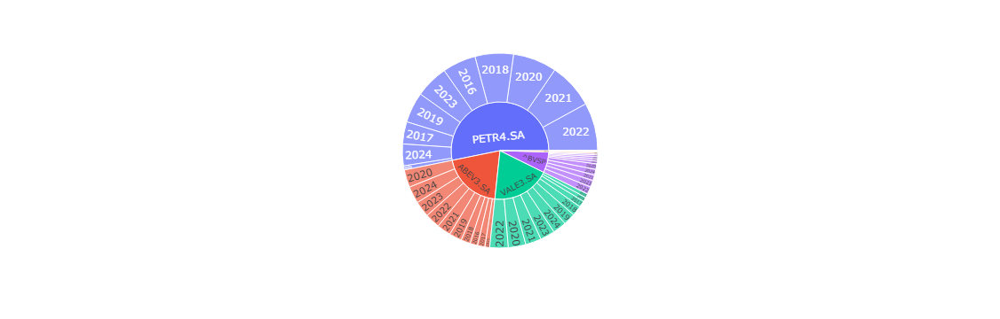

In [77]:
# Gerando gráfico de pizza ".sunburst"

fig = px.sunburst(data_agrupado, path=['ativo', 'ano'], values='volume')
fig.show()

In [78]:
# Um exemplo de dados do próprio plotly
# População por continente por país

df = px.data.gapminder().query('year == 2007')
df.head()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
11,Afghanistan,Asia,2007,43.828,31889923,974.580338,AFG,4
23,Albania,Europe,2007,76.423,3600523,5937.029526,ALB,8
35,Algeria,Africa,2007,72.301,33333216,6223.367465,DZA,12
47,Angola,Africa,2007,42.731,12420476,4797.231267,AGO,24
59,Argentina,Americas,2007,75.320,40301927,12779.379640,ARG,32


In [79]:
# Gráfico
fig = px.sunburst(df, path=['continent', 'country'], values='pop',
                 color='lifeExp', hover_data=['iso_alpha'])
fig.show()

## 5 - Suavização de séries

- Compreender o conceito de *down sampling* e sua aplicação em séries temporais.
- Calcular a média móvel utilizando o método na mesma série.
- Aplicar o comando na base de retornos calculados no Yahoo.

De forma semelhante ao `.resampling()`, temos um método prático no Pandas para calcularmos funções dentro de janelas móveis, o método `.rolling()`.

Duas formas populares de se suavizar uma série são:
- Média móvel: Consiste na média dos dados ao longo de uma janela móvel de tamanho fixo, digamos de tamanho 3.
- Suavização exponencial: método mais conhecido de suavização exponencial é chamado *ewma* (exponentially weighted moving average). Um tipo de média móvel em que se dá mais peso às observações recentes e peso sequencialmente menor para as observações mais antigas.


#### Selecionando um período maior - *Downsampling*

Se queremos o retorno mensal de uma ação, mas temos os valores diários, basta considerarmos apenas os valores de "fechamento de mês" e calcular os retornos normalmente - isto é chamado de ***downsampling***, pois estamos reduzindo a quantidade de dados disponível.

O método ```.resample()``` faz um agrupamento bem semelhante ao ```.groupby()```. Quando indicamos que agrupe a série por um período mais amplo que o original (ex: agrupar mensalmente uma série diária), fazemos um **downsampling**. 

Vamos usar os seguintes parâmetros dessa função:
- rule: é um *[offset string](https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases)* indicando o agrupamento (ex: 'W' para semana ou 'M' para mês),
- closed: indica se o intervalo é fechado à direita ou à esquerda,
- label: indica onde fica o rótulo do agrupamento

O funcionamento dos parâmetros ```closed``` e ```label``` está ilustrado na figura abaixo para uma série diária, agrupada semanalmente:

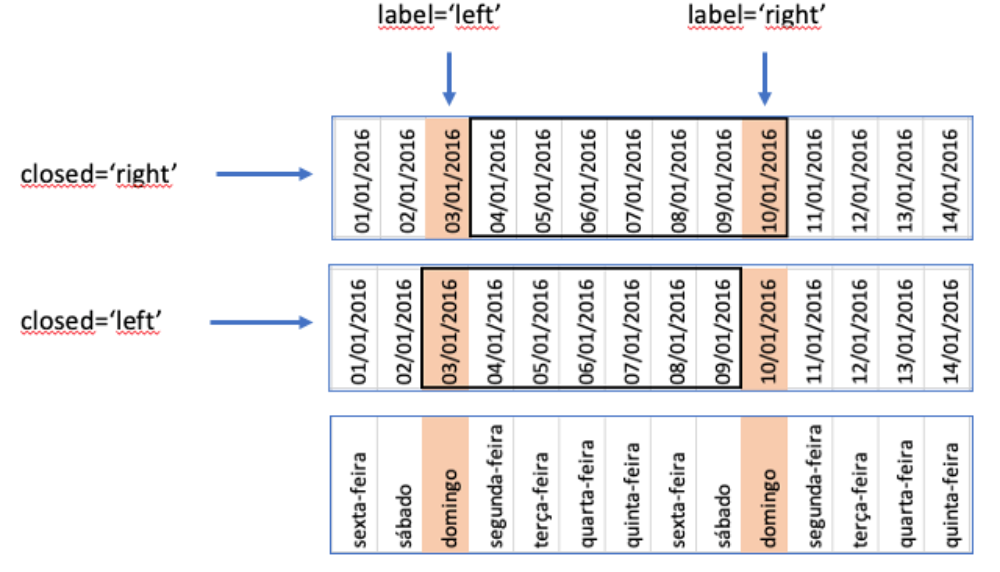

In [83]:
# Construindo uma série simples para exemplo
datas = pd.date_range('01/01/2016', periods=14, freq='D')
print(datas)

ts = pd.Series(list(range(7))*2, index=datas)
ts

DatetimeIndex(['2016-01-01', '2016-01-02', '2016-01-03', '2016-01-04',
               '2016-01-05', '2016-01-06', '2016-01-07', '2016-01-08',
               '2016-01-09', '2016-01-10', '2016-01-11', '2016-01-12',
               '2016-01-13', '2016-01-14'],
              dtype='datetime64[ns]', freq='D')


2016-01-01    0
2016-01-02    1
2016-01-03    2
2016-01-04    3
2016-01-05    4
2016-01-06    5
2016-01-07    6
2016-01-08    0
2016-01-09    1
2016-01-10    2
2016-01-11    3
2016-01-12    4
2016-01-13    5
2016-01-14    6
Freq: D, dtype: int64

**Aplicando o `.resample()`**

- rule = 'W' --> semanalmente, 'M' --> mensalmente...

In [85]:
ts.resample(rule='W', closed='right', label='left').ffill()

# ffill() --> Retorna o valor de 'fechamento' do período

2016-01-03    2
2016-01-10    2
2016-01-17    6
Freq: W-SUN, dtype: int64

In [86]:
# Podemos também envadear outros métodos como .max() e .mean()

ts.resample('W', closed='right', label='left').mean()

2015-12-27    1.0
2016-01-03    3.0
2016-01-10    4.5
Freq: W-SUN, dtype: float64

#### Média móvel (método `.rolling().mean()`)

Média móvel é um popular método de suavização de séries temporais. Consiste em sumarizar os dados de uma janela móvel de tamanho fixo através da média.

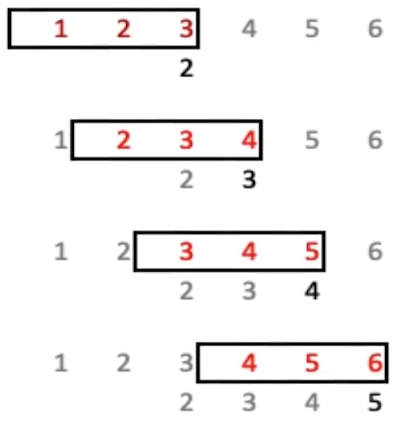

Como ilustrado, dada a série [1, 2, 3, 4, 5, 6], sua média móvel de tamanho 3 é a série [NaN, NaN, 2, 3, 4, 5].

In [88]:
# Testando na série simples

ts.rolling(3).mean()

2016-01-01         NaN
2016-01-02         NaN
2016-01-03    1.000000
2016-01-04    2.000000
2016-01-05    3.000000
2016-01-06    4.000000
2016-01-07    5.000000
2016-01-08    3.666667
2016-01-09    2.333333
2016-01-10    1.000000
2016-01-11    2.000000
2016-01-12    3.000000
2016-01-13    4.000000
2016-01-14    5.000000
Freq: D, dtype: float64

**Aplicando a média móvel na base de dados de ativos**

In [90]:
import yfinance as yf
import pandas as pd
import plotly.express as px

In [91]:
ativos = ['^BVSP', 'ITSA3.SA', 'PETR4.SA', 'ABEV3.SA', 'VALE3.SA']

data = yf.download(ativos, 
                   start='2018-01-01'
                   )
print(data.shape)
data.head()

[*********************100%***********************]  5 of 5 completed

(1796, 25)


Price           Close                                               High  \
Ticker       ABEV3.SA  ITSA3.SA  PETR4.SA   VALE3.SA    ^BVSP   ABEV3.SA   
Date                                                                       
2018-01-02  16.753670  4.771804  4.910487  24.093021  77891.0  16.800014   
2018-01-03  16.792288  4.754358  4.954995  23.948650  77995.0  16.969943   
2018-01-04  16.699600  4.863402  4.963895  24.046822  78647.0  16.854082   
2018-01-05  16.761395  4.863402  4.993567  24.422197  79071.0  16.800015   
2018-01-08  16.730495  4.915744  5.052908  24.965042  79379.0  16.761393   

Price                                               ...       Open            \
Ticker      ITSA3.SA  PETR4.SA   VALE3.SA    ^BVSP  ...   ABEV3.SA  ITSA3.SA   
Date                                                ...                        
2018-01-02  4.789251  4.910487  24.104572  77909.0  ...  16.475600  4.632227   
2018-01-03  4.841594  4.960928  24.185423  78414.0  ...  16.653253  4.749996   
2018-01-04  4.893935  5.032138  24.468391  79135.0  ...  16.792289  4.763081   
2018-01-05  4.902658  5.002468  24.422197  79071.0  ...  16.699601  4.863402   
2018-01-08  4.915744  5.052908  24.965042  79395.0  ...  16.761393  4.828508   

Price                                       Volume                     \
Ticker      PETR4.SA   VALE3.SA    ^BVSP  ABEV3.SA ITSA3.SA  PETR4.SA   
Date                                                                    
2018-01-02  4.803673  23.353828  76403.0  12717900   178931  33461800   
2018-01-03  4.892686  24.156548  77889.0   9389900   157027  55940900   
2018-01-04  4.978731  24.144997  77998.0   9150100   184479  37064900   
2018-01-05  4.954995  24.006401  78644.0  11510200   166273  26958200   
2018-01-08  4.966863  24.485724  79070.0   7074000   165135  28400000   

Price                            
Ticker      VALE3.SA      ^BVSP  
Date                             
2018-01-02  14156500  2880300.0  
2018-01-03  12744200  3142200.0  
2018-01-04  18433000  3486100.0  
2018-01-05  15251300  2747100.0  
2018-01-08  14542800  2550800.0  

[5 rows x 25 columns]

In [92]:
data_changed = data.Close.pct_change(fill_method=None)
data_changed.head(3)

Ticker,ABEV3.SA,ITSA3.SA,PETR4.SA,VALE3.SA,^BVSP
Date,,,,,
2018-01-02,NaN,NaN,NaN,NaN,NaN
2018-01-03,0.002305,-0.003656,0.009064,-0.005992,0.001335
2018-01-04,-0.005520,0.022936,0.001796,0.004099,0.008360


In [93]:
data_changed_vertical = data_changed.stack().reset_index()
data_changed_vertical.columns = ['data', 'ativo', 'valor']

# Figura
fig = px.line(data_changed_vertical, x='data', y='valor', color='ativo')
fig.update_layout(title='Volatilidade')
fig.show()

data_changed_vertical.head(7)

,data,ativo,valor
0,2018-01-03,ABEV3.SA,0.002305
1,2018-01-03,ITSA3.SA,-0.003656
2,2018-01-03,PETR4.SA,0.009064
3,2018-01-03,VALE3.SA,-0.005992
4,2018-01-03,^BVSP,0.001335
5,2018-01-04,ABEV3.SA,-0.005520
6,2018-01-04,ITSA3.SA,0.022936


**Agora sim, aplicando a média móvel**

In [95]:
# Uma janela de praticamente 1 ano, com tamanho = 360

data_changed_mm360 = data_changed.rolling(360).mean()
data_changed_mm360 = data_changed_mm360.stack().reset_index()
data_changed_mm360.columns = ['data', 'ativo', 'valor']
data_changed_mm360.head(7)

,data,ativo,valor
0,2019-06-18,ABEV3.SA,-0.000307
1,2019-06-18,ITSA3.SA,0.001378
2,2019-06-18,PETR4.SA,0.001976
3,2019-06-18,VALE3.SA,0.001043
4,2019-06-19,ABEV3.SA,-0.000291
5,2019-06-19,ITSA3.SA,0.001413
6,2019-06-19,PETR4.SA,0.001958


In [96]:
# Gerando o gráfico associado à média móvel

fig = px.line(data_changed_mm360, x='data', y='valor', color='ativo', template='plotly_white')
fig.show()

## 6 - Gráfico de Candlestick

- Compreensão da estrutura de um gráfico de candlestick
- Aplicação da biblioteca pandas para manipular dados
- Personalizar e interagir com gráficos usando Python

O Plotly também possui um tipo de gráfico (candlestick) especial para mostrar variações de ativos dentro de períodos. É um gráfico bastante comum para esse fim. 

- A cor da caixa indica se o dia foi de queda ou de elevação do ativo
- A caixa indica os valores de abertura e fechamento
- As linhas finas indicam os valores mínimo e máximo do dia

**Selecionando um único ativo**

Primeiramente vamos selecionar apenas um valor dos que baixamos, por exemplo o índice Ibovespa.

Lembrando que o dataframe possui um índice hierárquico para as colunas, vamos precisar selecioná-las através de uma lista de tuplas.

In [100]:
data.columns

MultiIndex([( 'Close', 'ABEV3.SA'),
            ( 'Close', 'ITSA3.SA'),
            ( 'Close', 'PETR4.SA'),
            ( 'Close', 'VALE3.SA'),
            ( 'Close',    '^BVSP'),
            (  'High', 'ABEV3.SA'),
            (  'High', 'ITSA3.SA'),
            (  'High', 'PETR4.SA'),
            (  'High', 'VALE3.SA'),
            (  'High',    '^BVSP'),
            (   'Low', 'ABEV3.SA'),
            (   'Low', 'ITSA3.SA'),
            (   'Low', 'PETR4.SA'),
            (   'Low', 'VALE3.SA'),
            (   'Low',    '^BVSP'),
            (  'Open', 'ABEV3.SA'),
            (  'Open', 'ITSA3.SA'),
            (  'Open', 'PETR4.SA'),
            (  'Open', 'VALE3.SA'),
            (  'Open',    '^BVSP'),
            ('Volume', 'ABEV3.SA'),
            ('Volume', 'ITSA3.SA'),
            ('Volume', 'PETR4.SA'),
            ('Volume', 'VALE3.SA'),
            ('Volume',    '^BVSP')],
           names=['Price', 'Ticker'])

**Criando lista de tupas correspondentes às colunas do indicador "^BVSP" com a função `zip()`.**

In [102]:
# Gerando as listas e tuplas

lista_indicadores = ['Close', 'High', 'Low', 'Open', 'Volume']
ativo = ['^BVSP']*len(lista_indicadores)
print(lista_indicadores)
print(ativo)

# Gerando a lista de tuplas
colunas = list(zip(lista_indicadores, ativo))
colunas

['Close', 'High', 'Low', 'Open', 'Volume']
['^BVSP', '^BVSP', '^BVSP', '^BVSP', '^BVSP']


[('Close', '^BVSP'),
 ('High', '^BVSP'),
 ('Low', '^BVSP'),
 ('Open', '^BVSP'),
 ('Volume', '^BVSP')]

Selecionando os dados somente do índice Ibovespa. Vamos aproveitar e selecionar um período menor, utilizando o *slicing* de data no *index* do nosso objeto.

In [104]:
# Utilizando o slicing, indicando a data (index) e todos os dados a partir desse ponto [data: ]
# indicando as colunas de interesse
bvsp = data.loc['01/01/2025': '03/24/2025', colunas] 
bvsp.columns = lista_indicadores

bvsp.tail()

,Close,High,Low,Open,Volume
Date,,,,,
2025-03-18,131475.0,131834.0,130722.0,130832.0,10992400.0
2025-03-19,132508.0,132984.0,131451.0,131476.0,12204900.0
2025-03-20,131955.0,132713.0,131813.0,132505.0,14187500.0
2025-03-21,132345.0,132588.0,131776.0,132005.0,14192000.0
2025-03-24,131321.0,132424.0,130992.0,132344.0,8301200.0


##### Construindo o gráfico

A função que faz o **candlestick** é a `graph_objects.Figure`. Ela não está no plotly express, então vamos precisar importá-la.

Vamos passar diversos parâmetros ao mesmo tempo para a função que constrói o gráfico através de um único objeto do tipo dicionário. O dicionário deve conter todos os parâmetros da função, sendo:

- x - o valor que deve entrar no eixo x
- open - o valor de abertura do ativo
- close -  o valor de fechamento do ativo
- high - o valor máximo
- low - o valor mínimo
- type - o tipo de gráfico que vai ser um *condlestick*
- name - o nome do ativo que vai aparecer na legenda
- showlegend - um parâmetro estético que defini se deve ou não mostrar a legenda

In [106]:
# importando
from plotly import graph_objects
from plotly.graph_objects import Layout

In [107]:
# Os parâmetros
graph = {
    'x': bvsp.index,
    'open': bvsp.Open,
    'close': bvsp.Close,
    'high': bvsp.High,
    'low': bvsp.Low,
    'type': 'candlestick',
    'name': '^BVSP',
    'showlegend': True
}

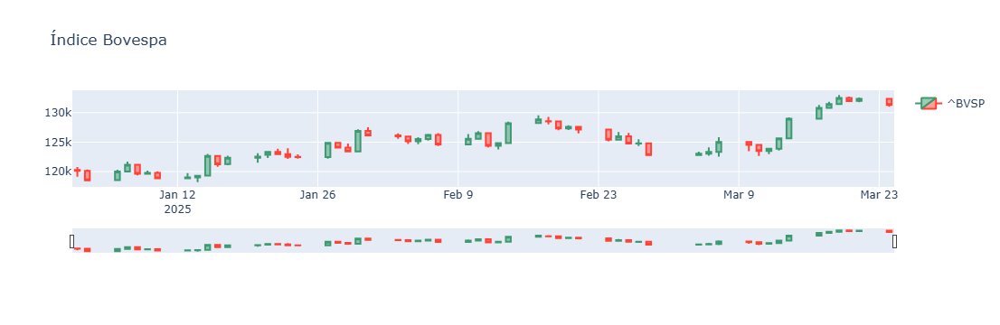

In [108]:
# Gráfico mais "cru"
grafico = graph_objects.Figure(
    data = [graph],
    layout_title='Índice Bovespa',
    # layout=layout
)

grafico

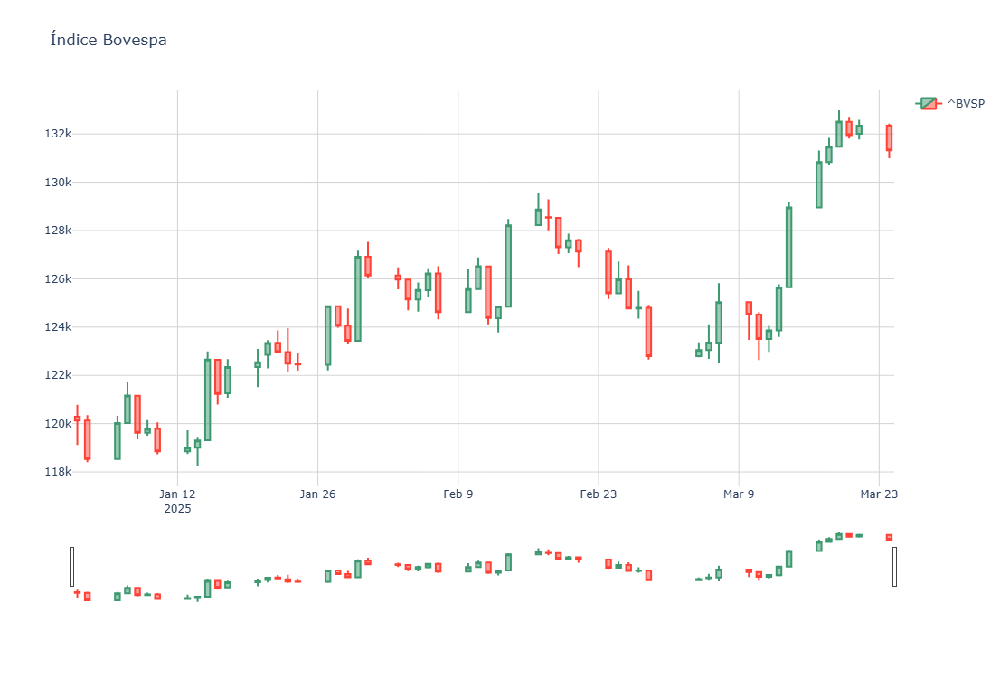

In [109]:
# Adicionando ajustes

layout = Layout(
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

grafico = graph_objects.Figure(
    data = [graph],
    layout_title='Índice Bovespa',
    layout=layout
)
grafico.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
grafico.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey')
grafico.update_layout(width=1100, height=750)

grafico